In [1]:
import numpy as np
import os
import re
import matplotlib.pyplot as plt
%matplotlib inline
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
import keras
import tensorflow as tf
from tensorflow.keras.utils import to_categorical
from keras.models import Sequential,Model
from tensorflow.keras.layers import Input
from keras.layers import Dense, Dropout, Flatten
#from keras.layers import Conv2D, MaxPooling2D
#from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import (
    BatchNormalization, SeparableConv2D, MaxPooling2D, Activation, Flatten, Dropout, Dense, Conv2D
)
from keras.layers import LeakyReLU

alto = 128
ancho = 128

# Leer imágenes 

Este código está diseñado para recorrer un directorio específico y sus subdirectorios, leer todas las imágenes con extensiones .jpg, .jpeg, .png, .bmp, o .tiff, y almacenar información sobre estas imágenes y los directorios donde se encuentran.

In [13]:
import os
import re
import matplotlib.pyplot as plt

# Dimensiones deseadas para las imágenes
ancho_deseado = ancho  # Ancho de la imagen
alto_deseado = alto   # Alto de la imagen

# Ruta de la carpeta con las imágenes
dirname = os.path.join(os.getcwd(), 'carros2/')
imgpath = dirname + os.sep 

images = []
directories = []
dircount = []
prevRoot = ''
cant = 0
print("Leyendo imágenes de ", imgpath)

# Recorrer todos los subdirectorios y archivos
for root, dirnames, filenames in os.walk(imgpath):
    for filename in filenames:
        if re.search(r"\.(jpg|jpeg|png|bmp|tiff)$", filename, re.IGNORECASE):  # Filtrar imágenes por extensión
            filepath = os.path.join(root, filename)
            image = plt.imread(filepath)  # Leer la imagen
            
            # Verificar si la imagen tiene las dimensiones deseadas
            if len(image.shape) == 3:  # Asegurar que es una imagen RGB
                alto, ancho, _ = image.shape
                if alto == alto_deseado and ancho == ancho_deseado:
                    images.append(image)
                    cant += 1
                    print(f"Leyendo... {cant}", end="\r")

            # Detectar cambio de directorio
            if prevRoot != root:
                print(root, cant)
                prevRoot = root
                directories.append(root)
                dircount.append(cant)
                cant = 0

# Agregar el último directorio
dircount.append(cant)
dircount = dircount[1:]
dircount[0] = dircount[0] + 1

# Resultados
print('Directorios leídos:', len(directories))
print("Imágenes en cada directorio:", dircount)
print('Suma total de imágenes en subdirs:', sum(dircount))


Leyendo imágenes de  C:\Users\omar_\OneDrive\Documentos\IA\3er Proyecto (Carros CNN)\carros2/\
C:\Users\omar_\OneDrive\Documentos\IA\3er Proyecto (Carros CNN)\carros2/\Camaro_img_15fps 1
C:\Users\omar_\OneDrive\Documentos\IA\3er Proyecto (Carros CNN)\carros2/\Lambo_img_15fps 9635
C:\Users\omar_\OneDrive\Documentos\IA\3er Proyecto (Carros CNN)\carros2/\Passat_img_15fps 9791
Leyendo... 1553

KeyboardInterrupt: 

# Generación de Etiquetas 

Esta sección del código está asignando una etiqueta numérica a cada imagen basada en el directorio del que proviene. Si un directorio tiene 5 imágenes, todas esas imágenes tendrán la misma etiqueta (por ejemplo, 0), y luego la etiqueta cambiará para el próximo directorio. Esto es útil para clasificar las imágenes según sus directorios de origen.

In [8]:
labels=[]
indice=0
for cantidad in dircount:
    for i in range(cantidad):
        labels.append(indice)
    indice=indice+1
print("Cantidad etiquetas creadas: ",len(labels))

Cantidad etiquetas creadas:  1


Esta sección del código permite identificar y almacenar los nombres de los subdirectorios de manera organizada, lo cual puede ser útil para el análisis posterior o para referenciar los datos procesados.

In [9]:
sriesgos=[]
indice=0
for directorio in directories:
    name = directorio.split(os.sep)
    print(indice , name[len(name)-1])
    sriesgos.append(name[len(name)-1])
    indice=indice+1

0 Camaro_img_15fps
1 Lambo_img_15fps
2 Passat_img_15fps
3 Tsuru_img_15fps
4 Vocho_img_15fps


Esta sección del código convierte las listas de etiquetas e imágenes en arreglos de NumPy para facilitar su manipulación. Luego, identifica las clases únicas presentes en las etiquetas y calcula el número total de clases, imprimiendo esta información. Esto es útil para entender la distribución de las clases en el conjunto de datos y preparar los datos para análisis o entrenamiento de modelos.

In [10]:
import numpy as np
import cv2

# Simula la lista de imágenes (ejemplo)
images = [cv2.resize(img, (ancho, alto)) if img is not None else None for img in images]

# Verifica y filtra imágenes no válidas
images = [img for img in images if img is not None and len(img.shape) == 3]

# Convierte a un array de NumPy
X = np.array(images, dtype=np.uint8)

# Convierte las etiquetas
y = np.array(labels)

# Verifica clases y salida
classes = np.unique(y)
nClasses = len(classes)
print('Total number of outputs : ', nClasses)
print('Output classes : ', classes)


Total number of outputs :  1
Output classes :  [0]


Esta sección del código divide el conjunto de datos en dos partes: datos de entrenamiento (80%) y datos de prueba (20%). Luego, imprime las dimensiones de estos conjuntos de datos. Esta división es crucial en el proceso de entrenamiento y evaluación de modelos de aprendizaje automático, ya que permite evaluar el rendimiento del modelo en datos no vistos durante el entrenamiento.

In [11]:
train_X,test_X,train_Y,test_Y = train_test_split(X,y,test_size=0.2)
print('Training data shape : ', train_X.shape, train_Y.shape)
print('Testing data shape : ', test_X.shape, test_Y.shape)

ValueError: Found input variables with inconsistent numbers of samples: [0, 1]

Esta sección del código utiliza Matplotlib para mostrar las primeras imágenes de los conjuntos de datos de entrenamiento y de prueba, junto con sus etiquetas correspondientes.

Text(0.5, 1.0, 'Ground Truth : 3')

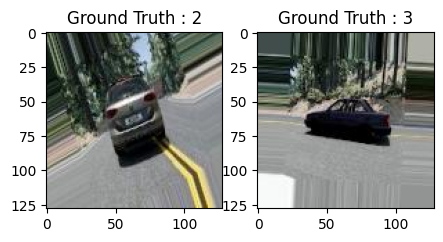

In [252]:
plt.figure(figsize=[5,5])

# Display the first image in training data
plt.subplot(121)
plt.imshow(train_X[0,:,:], cmap='gray')
plt.title("Ground Truth : {}".format(train_Y[0]))

# Display the first image in testing data
plt.subplot(122)
plt.imshow(test_X[0,:,:], cmap='gray')
plt.title("Ground Truth : {}".format(test_Y[0]))

Esta sección del código convierte los datos de imágenes a tipo de dato float32 y normaliza los valores de píxel para que estén en el rango [0, 1]. Luego, visualiza una imagen del conjunto de datos de prueba. La normalización es crucial para el entrenamiento efectivo de modelos de aprendizaje automático.

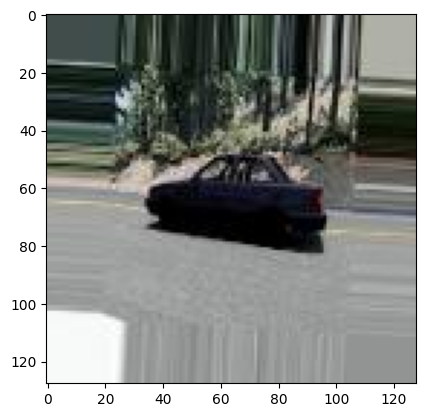

In [253]:
rain_X = train_X.astype('float32')
test_X = test_X.astype('float32')
train_X = train_X/255.
test_X = test_X/255.
plt.imshow(test_X[0,:,:])

Esta sección del código convierte las etiquetas de clase en formato entero a un formato de codificación one-hot. Esto es importante porque muchos algoritmos de aprendizaje automático, especialmente las redes neuronales, funcionan mejor con etiquetas en formato one-hot. Luego, se imprime una etiqueta antes y después de la conversión para verificar el proceso.

In [254]:
train_Y_one_hot = to_categorical(train_Y)
test_Y_one_hot = to_categorical(test_Y)
print('Original label:', train_Y[0])
print('After conversion to one-hot:', train_Y_one_hot[0])

Original label: 2
After conversion to one-hot: [0. 0. 1. 0. 0.]


Esta sección del código toma el conjunto de datos de entrenamiento y lo divide en dos conjuntos: uno para continuar el entrenamiento y otro para la validación. La validación es una parte crucial del proceso de entrenamiento de modelos de aprendizaje automático porque permite evaluar el rendimiento del modelo en datos no vistos durante el entrenamiento, ayudando a prevenir el sobreajuste.

In [255]:
#Mezclar todo y crear los grupos de entrenamiento y testing
train_X,valid_X,train_label,valid_label = train_test_split(train_X, train_Y_one_hot, test_size=0.2, random_state=13)

Esta sección del código es útil para verificar que los conjuntos de datos se han dividido correctamente y que las formas de los datos son las esperadas. Esto asegura que los datos estén listos para ser utilizados en el entrenamiento y validación del modelo.

In [256]:
print(train_X.shape,valid_X.shape,train_label.shape,valid_label.shape)

(24784, 128, 128, 3) (6197, 128, 128, 3) (24784, 5) (6197, 5)


Esta sección del código define y configura varios parámetros importantes para el entrenamiento de una red neuronal. Estos parámetros incluyen la tasa de aprendizaje inicial, el número de épocas y el tamaño del lote.

In [257]:
#declaramos variables con los parámetros de configuración de la red
INIT_LR = 1e-2 # Valor inicial de learning rate. El valor 1e-3 corresponde con 0.001
epochs = 24 # Cantidad de iteraciones completas al conjunto de imagenes de entrenamiento
batch_size = 64 # cantidad de imágenes que se toman a la vez en memoria



Esta sección del código define un modelo de red neuronal convolucional (CNN) utilizando la API de Keras. La red consta de varias capas, incluyendo capas convolucionales, de activación, de pooling, de normalización (Dropout) y densas (fully connected).

In [260]:
riesgo_model = Sequential([
    Conv2D(32, (3, 3), activation='relu', input_shape=(alto, ancho, 3)),
    Dropout(0.2),
    MaxPooling2D((2, 2)),
    Conv2D(64, (3, 3), activation='relu'),
    Dropout(0.3),
    MaxPooling2D((2, 2)),
    Conv2D(128, (3, 3), activation='relu'),
    Dropout(0.4),
    MaxPooling2D((2, 2)),
    Conv2D(256, (3, 3), activation='relu'),
    Dropout(0.5),
    MaxPooling2D((2, 2)),
    Flatten(),
    Dense(256, activation='relu'),
    Dropout(0.5),
    Dense(nClasses, activation='softmax')
])

In [261]:
riesgo_model.summary()

Model: "sequential_15"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_39 (Conv2D)                   │ (None, 126, 126, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_54 (Dropout)                 │ (None, 126, 126, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_35 (MaxPooling2D)      │ (None, 63, 63, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_40 (Conv2D)                   │ (None, 61, 61, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_55 (Dropout)                 │ (None, 61, 61, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_36 (MaxPooling2D)      │ (None, 30, 30, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_41 (Conv2D)                   │ (None, 28, 28, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_56 (Dropout)                 │ (None, 28, 28, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_37 (MaxPooling2D)      │ (None, 14, 14, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_42 (Conv2D)                   │ (None, 12, 12, 256)         │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_57 (Dropout)                 │ (None, 12, 12, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_38 (MaxPooling2D)      │ (None, 6, 6, 256)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_15 (Flatten)                 │ (None, 9216)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_30 (Dense)                     │ (None, 256)                 │       2,359,552 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_58 (Dropout)                 │ (None, 256)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_31 (Dense)                     │ (None, 5)                   │           1,285 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 2,749,253 (10.49 MB)

 Trainable params: 2,749,253 (10.49 MB)

 Non-trainable params: 0 (0.00 B)

Esta sección del código configura la función de pérdida, el optimizador y las métricas que se utilizarán durante el entrenamiento del modelo. La compilación del modelo es un paso crucial que prepara el modelo para ser entrenado con los datos.

In [262]:
riesgo_model.compile(loss=keras.losses.categorical_crossentropy, optimizer=tf.keras.optimizers.SGD(learning_rate=INIT_LR, decay=INIT_LR / 100),metrics=['accuracy'])


Esta sección del código entrena el modelo de red neuronal convolucional utilizando los datos de entrenamiento. Durante el entrenamiento, el modelo se ajusta iterativamente a los datos, actualizando sus parámetros para minimizar la función de pérdida. El conjunto de datos de validación se utiliza para monitorear el rendimiento del modelo y prevenir el sobreajuste.

In [263]:
riesgo_train = riesgo_model.fit(
    train_X, 
    train_label, 
    batch_size=batch_size,
    epochs=epochs,
    verbose=1,
    validation_data=(valid_X, valid_label))

Epoch 1/24
388/388 ━━━━━━━━━━━━━━━━━━━━ 361s 921ms/step - accuracy: 0.2500 - loss: 1.5990 - val_accuracy: 0.3766 - val_loss: 1.5574
Epoch 2/24
388/388 ━━━━━━━━━━━━━━━━━━━━ 315s 812ms/step - accuracy: 0.4080 - loss: 1.3809 - val_accuracy: 0.6201 - val_loss: 1.3756
Epoch 3/24
388/388 ━━━━━━━━━━━━━━━━━━━━ 339s 875ms/step - accuracy: 0.5914 - loss: 1.0365 - val_accuracy: 0.6878 - val_loss: 1.1530
Epoch 4/24
388/388 ━━━━━━━━━━━━━━━━━━━━ 336s 866ms/step - accuracy: 0.7153 - loss: 0.7542 - val_accuracy: 0.7994 - val_loss: 0.9536
Epoch 5/24
388/388 ━━━━━━━━━━━━━━━━━━━━ 420s 1s/step - accuracy: 0.7865 - loss: 0.5680 - val_accuracy: 0.8788 - val_loss: 0.8356
Epoch 6/24
388/388 ━━━━━━━━━━━━━━━━━━━━ 475s 1s/step - accuracy: 0.8309 - loss: 0.4625 - val_accuracy: 0.8766 - val_loss: 0.7826
Epoch 7/24
388/388 ━━━━━━━━━━━━━━━━━━━━ 512s 1s/step - accuracy: 0.8690 - loss: 0.3673 - val_accuracy: 0.8632 - val_loss: 0.7831
Epoch 8/24
388/388 ━━━━━━━━━━━━━━━━━━━━ 509s 1s/step - accuracy: 0.8841 - loss: 0.326

In [264]:
riesgo_model.save("BigModel.h5", save_format="h5")
riesgo_model.save("BigModel.keras")

In [265]:
test_eval = riesgo_model.evaluate(test_X, test_Y_one_hot, verbose=1)

243/243 ━━━━━━━━━━━━━━━━━━━━ 21s 87ms/step - accuracy: 0.9710 - loss: 0.2308 


In [266]:
print('Test loss:', test_eval[0])
print('Test accuracy:', test_eval[1])

Test loss: 0.23263445496559143
Test accuracy: 0.9697908759117126


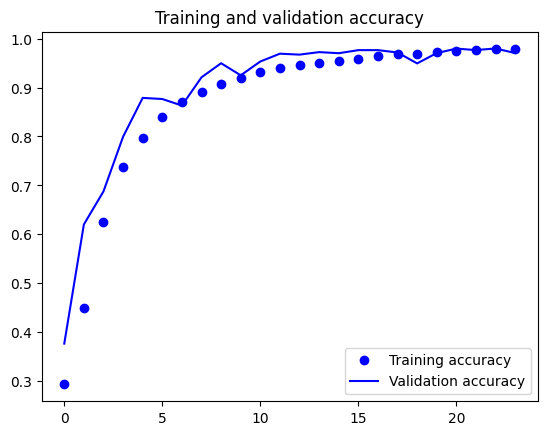

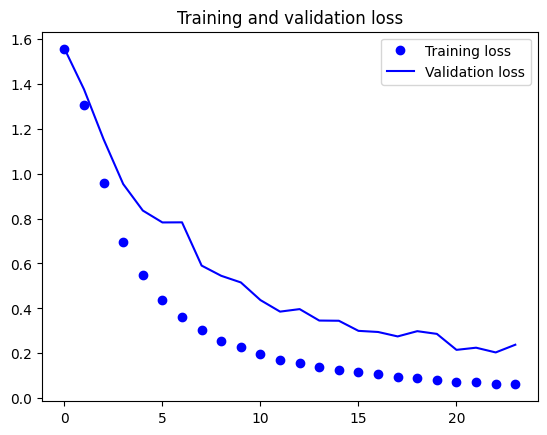

In [267]:
accuracy = riesgo_train.history['accuracy']
val_accuracy = riesgo_train.history['val_accuracy']
loss = riesgo_train.history['loss']
val_loss = riesgo_train.history['val_loss']
epochs = range(len(accuracy))
plt.plot(epochs, accuracy, 'bo', label='Training accuracy')
plt.plot(epochs, val_accuracy, 'b', label='Validation accuracy')
plt.title('Training and validation accuracy')
plt.legend()
plt.figure()
plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()
plt.show()

In [268]:
predicted_classes2 = riesgo_model.predict(test_X)

243/243 ━━━━━━━━━━━━━━━━━━━━ 21s 87ms/step


In [269]:
predicted_classes=[]
for predicted_riesgo in predicted_classes2:
    predicted_classes.append(predicted_riesgo.tolist().index(max(predicted_riesgo)))
predicted_classes=np.array(predicted_classes)

In [270]:
predicted_classes.shape, test_Y.shape

((7746,), (7746,))

Found 7512 correct labels


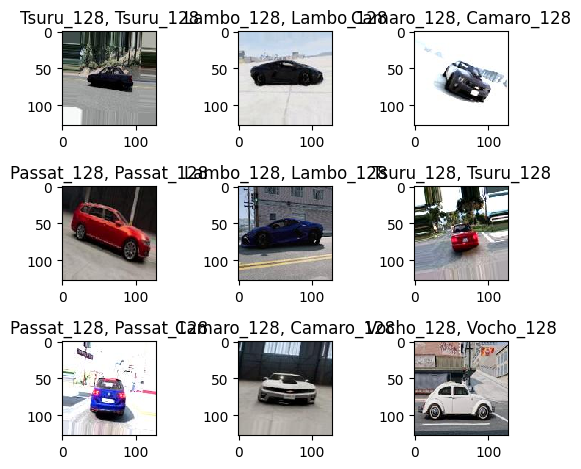

In [271]:
correct = np.where(predicted_classes==test_Y)[0]
print("Found %d correct labels" % len(correct))
for i, correct in enumerate(correct[0:9]):
    plt.subplot(3,3,i+1)
    plt.imshow(test_X[correct].reshape(alto,ancho,3), cmap='gray', interpolation='none')
    plt.title("{}, {}".format(sriesgos[predicted_classes[correct]],
                                                    sriesgos[test_Y[correct]]))

    plt.tight_layout()

Found 234 incorrect labels


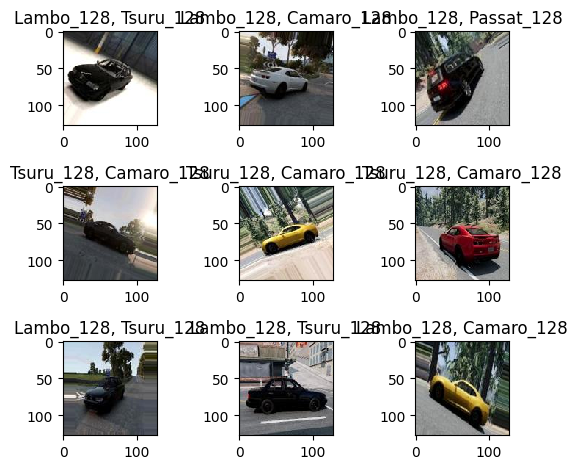

In [272]:
incorrect = np.where(predicted_classes!=test_Y)[0]
print("Found %d incorrect labels" % len(incorrect))
for i, incorrect in enumerate(incorrect[0:9]):
    plt.subplot(3,3,i+1)
    plt.imshow(test_X[incorrect].reshape(alto,ancho,3), cmap='gray', interpolation='none')
    plt.title("{}, {}".format(sriesgos[predicted_classes[incorrect]],
                                                    sriesgos[test_Y[incorrect]]))
    plt.tight_layout()

In [273]:
target_names = ["Class {}".format(i) for i in range(nClasses)]
print(classification_report(test_Y, predicted_classes, target_names=target_names))

              precision    recall  f1-score   support

     Class 0       1.00      0.90      0.94      1443
     Class 1       0.95      0.99      0.97      1533
     Class 2       0.98      0.98      0.98      1537
     Class 3       0.95      0.99      0.97      1615
     Class 4       0.99      0.99      0.99      1618

    accuracy                           0.97      7746
   macro avg       0.97      0.97      0.97      7746
weighted avg       0.97      0.97      0.97      7746



1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step


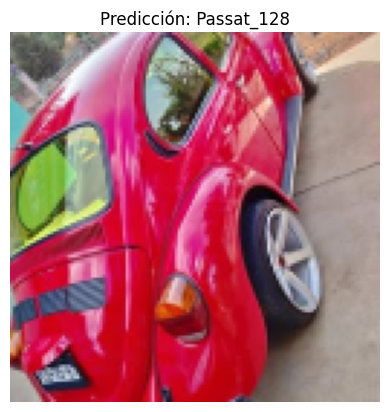

tests/448750560_431097536498316_1010631333420268912_n.jpg Passat_128


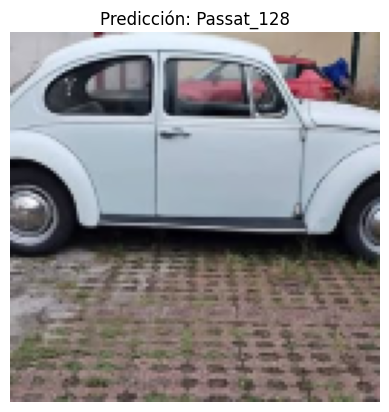

tests/466473922_1232196887901452_3565882820473766052_n.jpg Passat_128


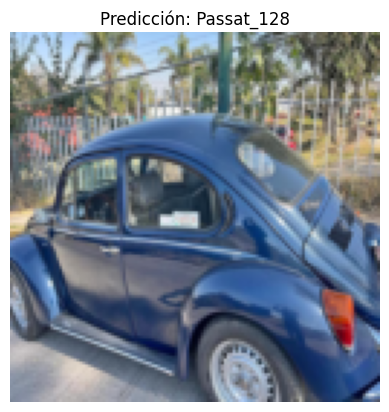

tests/469083263_553191234304702_3421400358216265035_n.jpg Passat_128


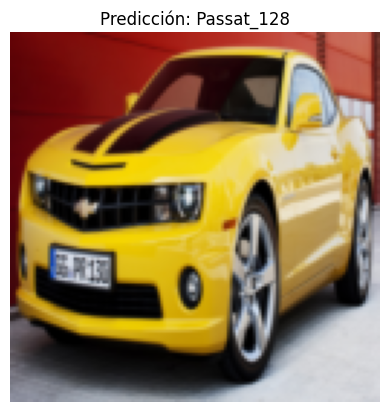

tests/CamaroA.jpg Passat_128


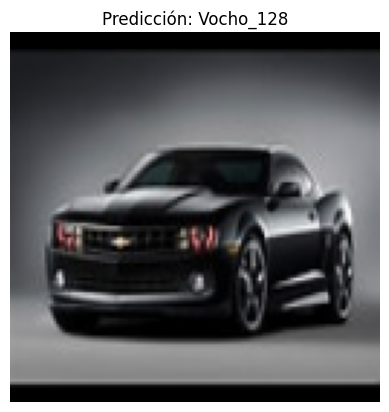

tests/CamN.jpg Vocho_128


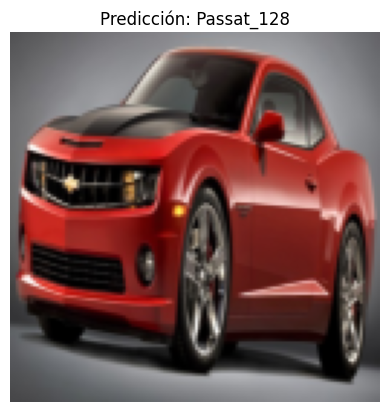

tests/CamRojo.jpg Passat_128


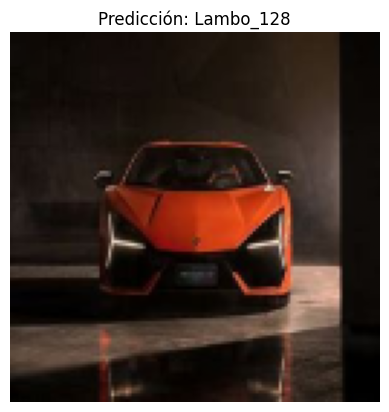

tests/download.jpg Lambo_128


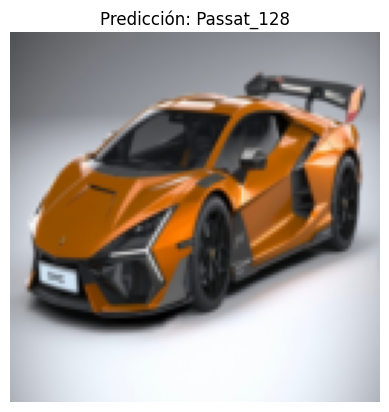

tests/LamboN.jpg Passat_128


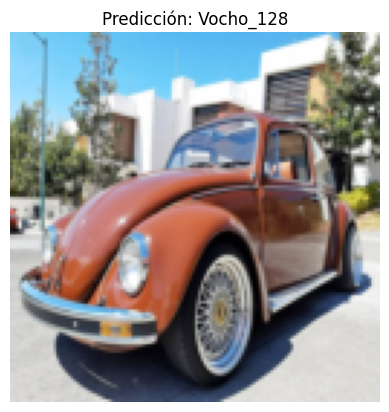

tests/naranja.jpg Vocho_128


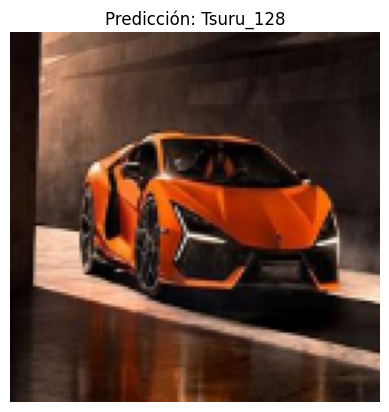

tests/OIP.jpg Tsuru_128


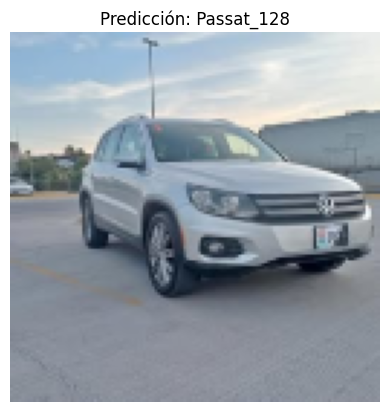

tests/pass.jpg Passat_128


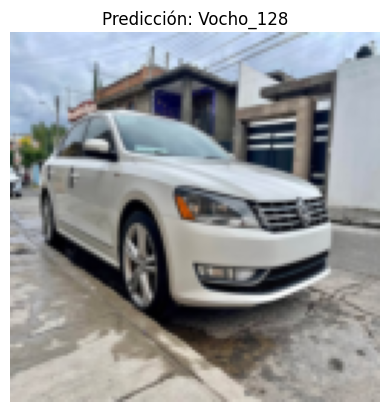

tests/pass2.jpg Vocho_128


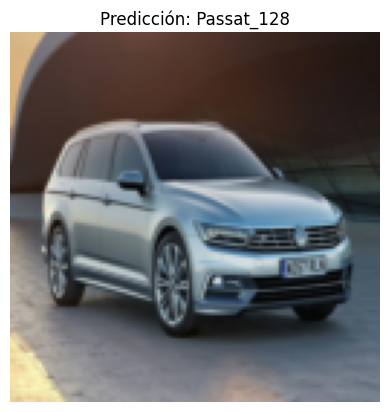

tests/passat.jpg Passat_128


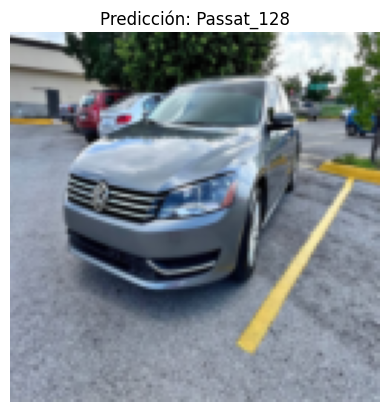

tests/passatV.jpg Passat_128


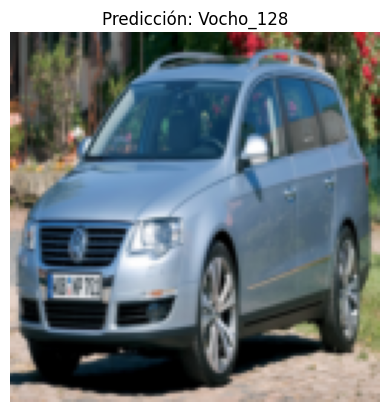

tests/passvar.jpg Vocho_128


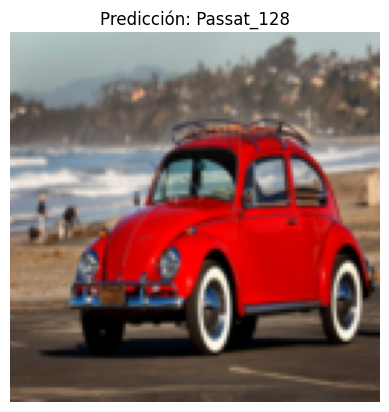

tests/R.jpg Passat_128


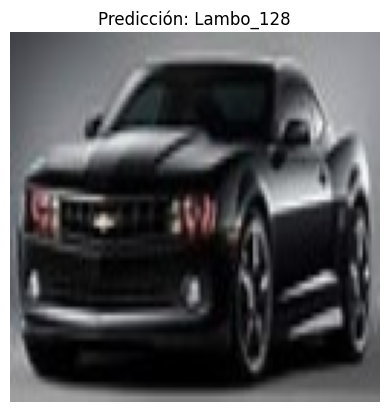

tests/th.jpg Lambo_128


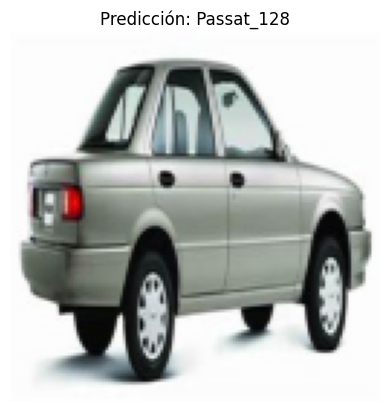

tests/Tsuru.jpg Passat_128


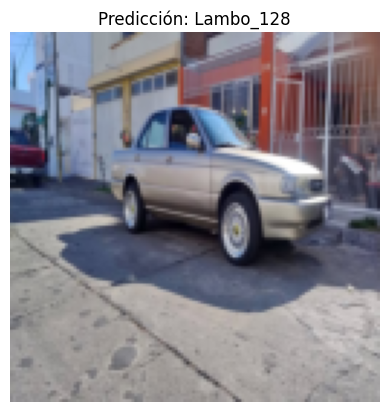

tests/Tsuru2010.jpg Lambo_128


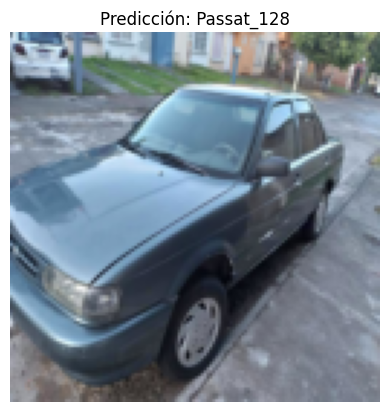

tests/tusuru.jpg Passat_128


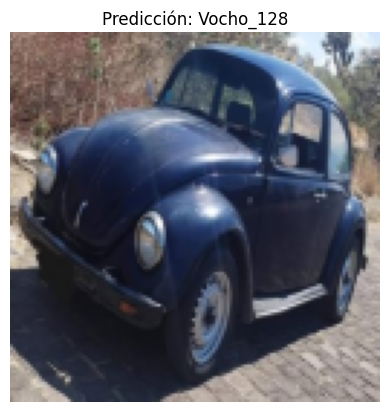

tests/vb.jpg Vocho_128


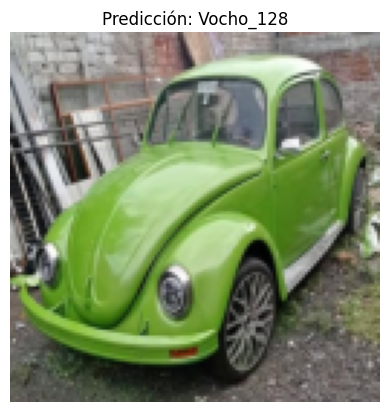

tests/vg.jpg Vocho_128


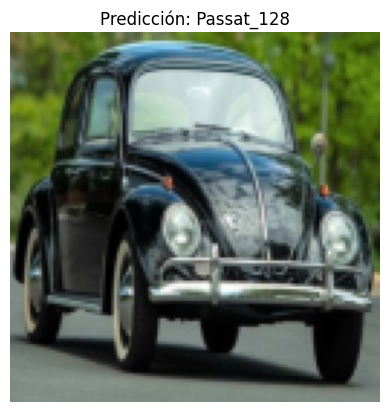

tests/VochoN.jpg Passat_128


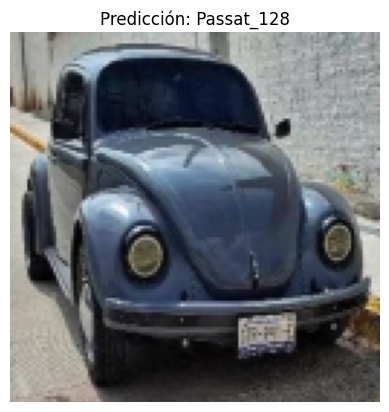

tests/VochoN2.jpg Passat_128


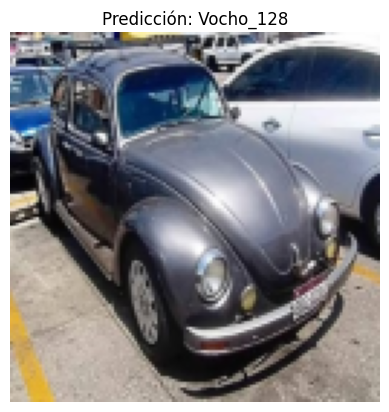

tests/vochonegro.jpg Vocho_128


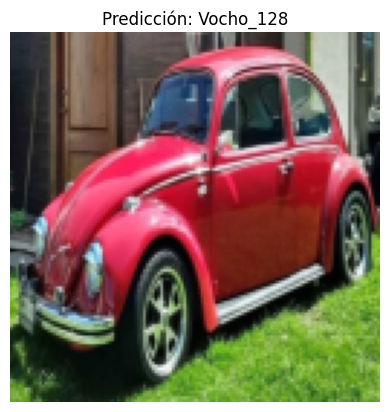

tests/vochoR.jpg Vocho_128


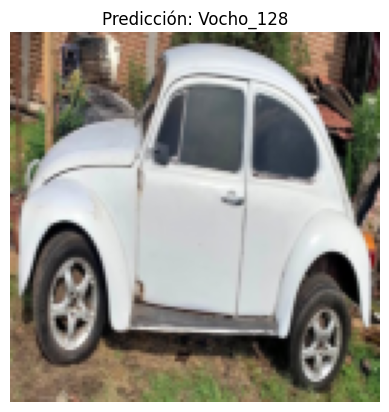

tests/vov.jpg Vocho_128


In [276]:
import os
import numpy as np
from skimage.io import imread
from skimage.transform import resize
import matplotlib.pyplot as plt

# Define la carpeta padre donde están las imágenes
parent_folder = r"tests/"

# Lista para almacenar las imágenes procesadas
images = []

# Lista para almacenar los nombres de archivo
filenames = []

# Dimensiones objetivo
alto = 128  # Altura deseada
ancho = 128  # Anchura deseada

# Itera sobre todas las imágenes en la carpeta padre y subcarpetas
for root, _, files in os.walk(parent_folder):
    for file in files:
        if file.lower().endswith(('.jpg', '.jpeg', '.png', '.bmp', '.tiff')):  # Filtra solo archivos de imagen
            filepath = os.path.join(root, file)
            filenames.append(filepath)  # Guarda la ruta completa del archivo

            image = imread(filepath)
            
            # Redimensiona la imagen al tamaño objetivo, estirándola
            image_resized = resize(image, (alto, ancho), anti_aliasing=True, preserve_range=True)

            # Normaliza la imagen para que los valores estén entre 0 y 1
            image_normalized = image_resized / 255.0
            
            images.append(image_normalized)

# Convierte las imágenes a un array de numpy
X = np.array(images, dtype=np.float32)

# Predice las clases de las imágenes procesadas usando el modelo
predicted_classes = riesgo_model.predict(X)

# Diccionario de clases de riesgo (debe estar definido previamente)
# Ejemplo: sriesgos = ['Bajo', 'Moderado', 'Alto']

for i, img_tagged in enumerate(predicted_classes):
    predicted_label = sriesgos[img_tagged.tolist().index(max(img_tagged))]
    
    # Mostrar la imagen procesada con su predicción
    plt.imshow(images[i])  # Muestra la imagen redimensionada
    plt.title(f"Predicción: {predicted_label}")
    plt.axis('off')  # Oculta los ejes
    plt.show()
    
    print(filenames[i], predicted_label)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 423ms/step


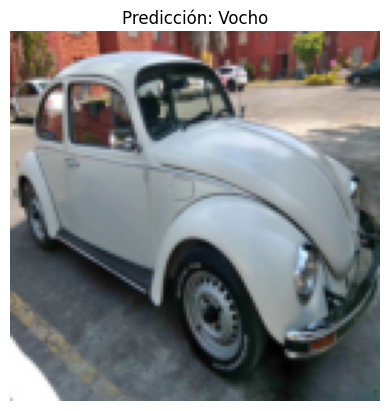

tests/433440032_382332878087095_1484667591455790504_n.jpg Vocho


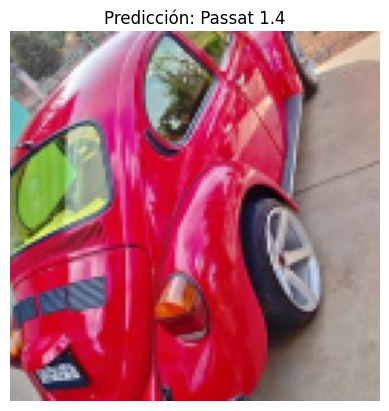

tests/448750560_431097536498316_1010631333420268912_n.jpg Passat 1.4


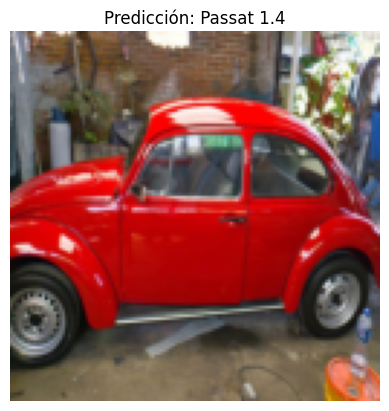

tests/465234932_9058055740885442_8231722643708465466_n.jpg Passat 1.4


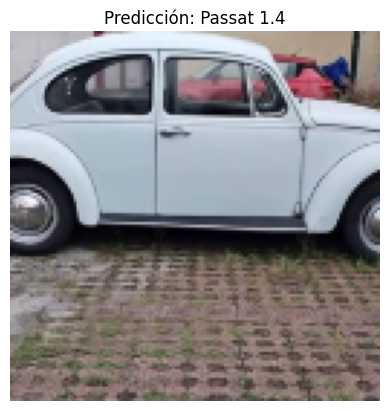

tests/466473922_1232196887901452_3565882820473766052_n.jpg Passat 1.4


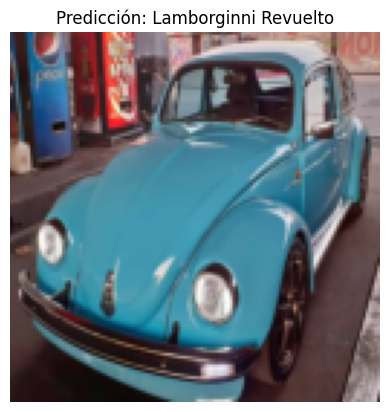

tests/468589065_9617493564944425_6401484735724912606_n.jpg Lamborginni Revuelto


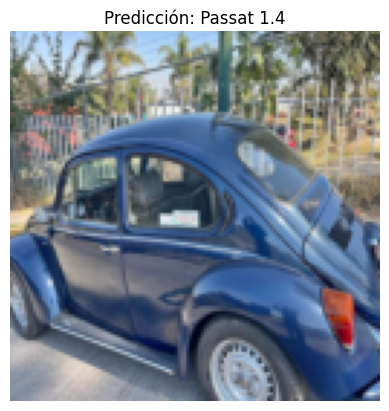

tests/469083263_553191234304702_3421400358216265035_n.jpg Passat 1.4


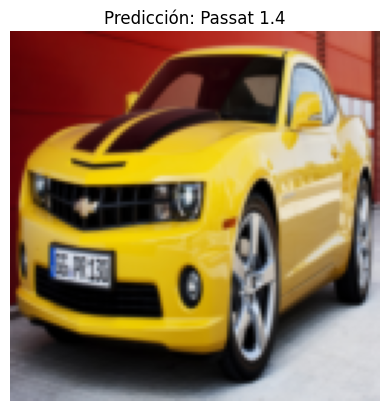

tests/CamaroA.jpg Passat 1.4


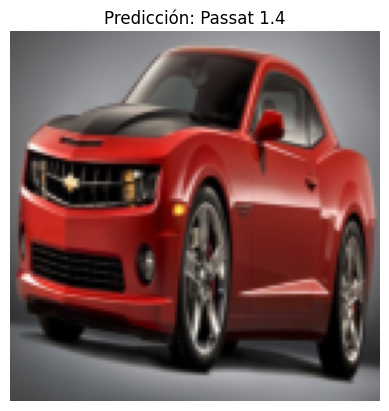

tests/CamRojo.jpg Passat 1.4


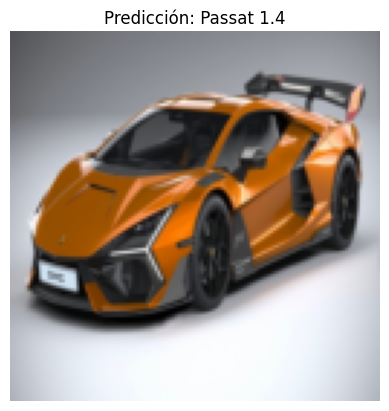

tests/LamboN.jpg Passat 1.4


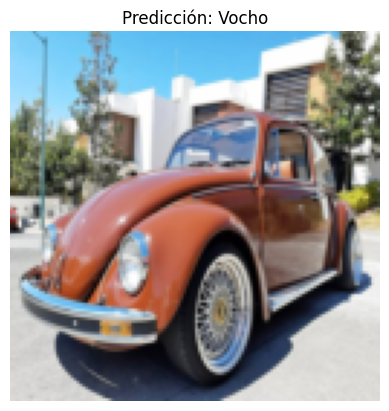

tests/naranja.jpg Vocho


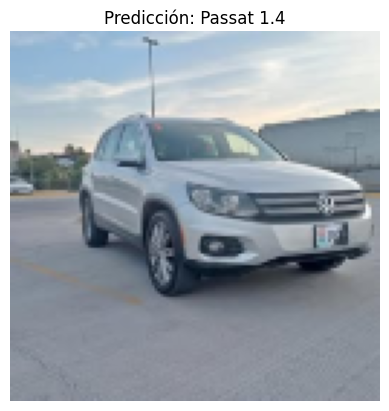

tests/pass.jpg Passat 1.4


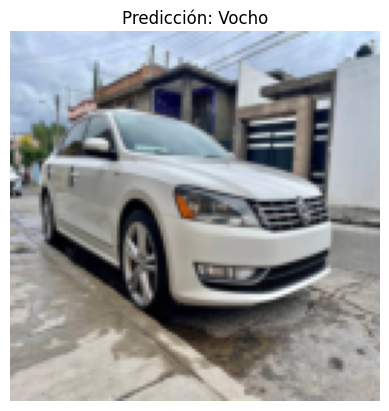

tests/pass2.jpg Vocho


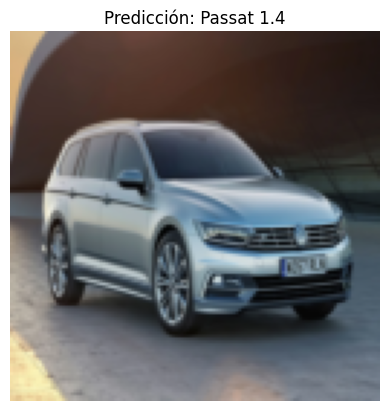

tests/passat.jpg Passat 1.4


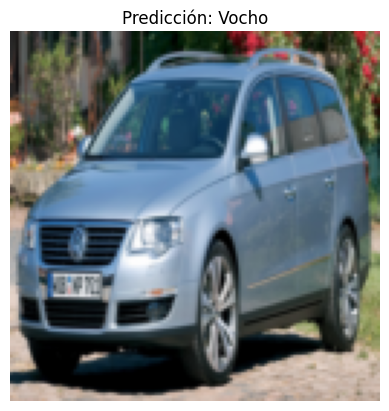

tests/passvar.jpg Vocho


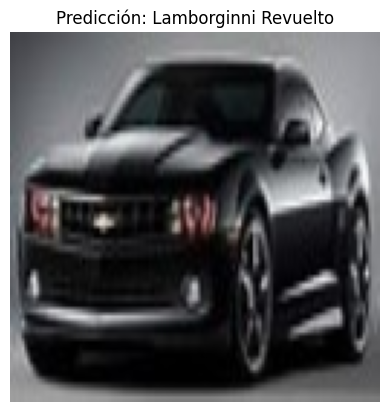

tests/th.jpg Lamborginni Revuelto


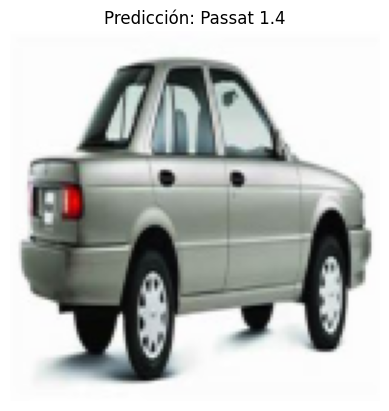

tests/Tsuru.jpg Passat 1.4


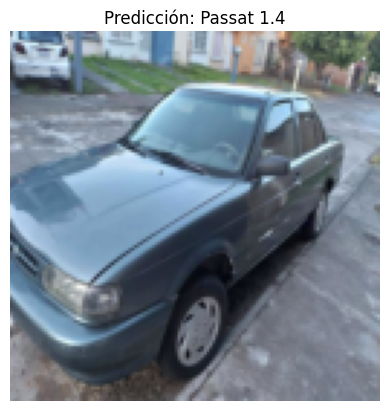

tests/tusuru.jpg Passat 1.4


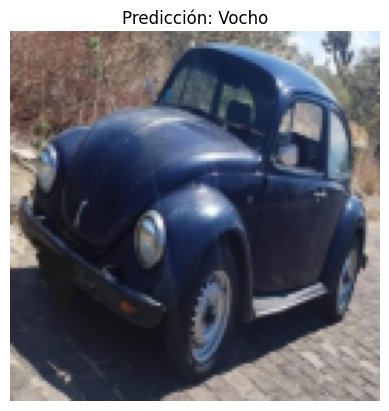

tests/vb.jpg Vocho


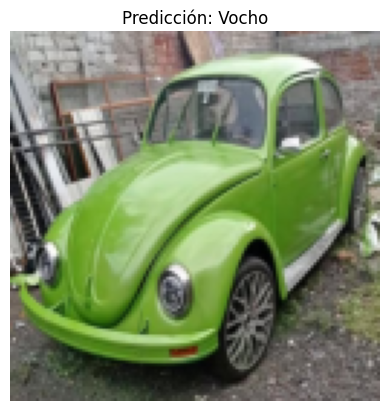

tests/vg.jpg Vocho


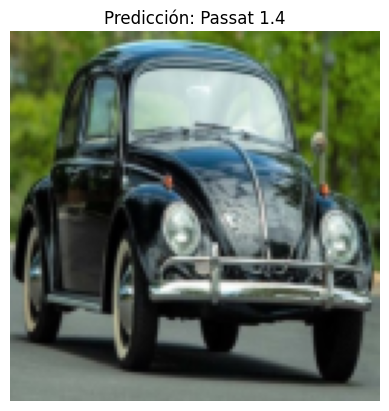

tests/VochoN.jpg Passat 1.4


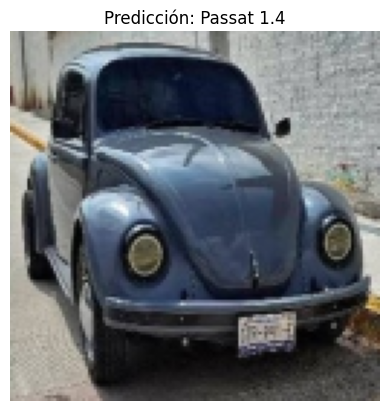

tests/vochon2.jpg Passat 1.4


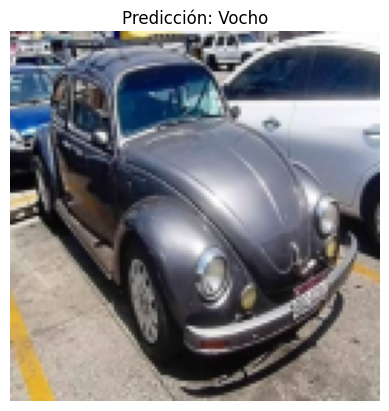

tests/vochonegro.jpg Vocho


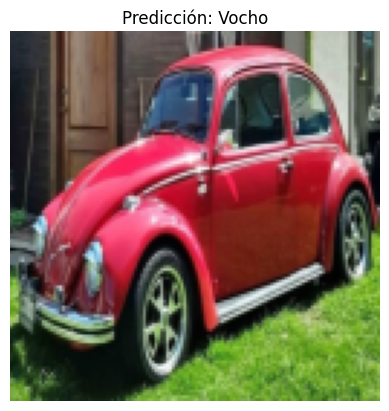

tests/vochoR.jpg Vocho


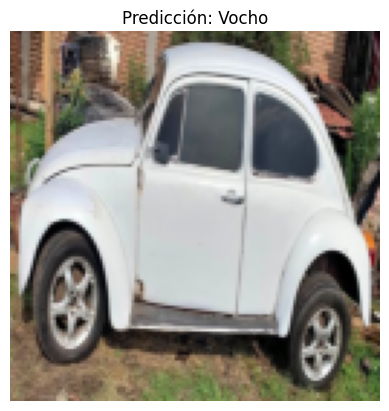

tests/vov.jpg Vocho


In [5]:
import os
import numpy as np
from skimage.io import imread
from skimage.transform import resize
import matplotlib.pyplot as plt
from tensorflow.keras.models import load_model



# Carga el modelo guardado
model_path = "BigModel.h5"
riesgo_model = load_model(model_path)

# Carpeta de imágenes de prueba
parent_folder = r"tests/"

# Inicializa listas para almacenar imágenes procesadas y nombres de archivo
images = []

filenames = []

# Diccionario de clases (asegúrate de que coincida con tu modelo)
sriesgos = ['Camaro 2008', 'Lamborginni Revuelto', 'Passat 1.4', 'Tsuru 2010', 'Vocho']
# Lista para almacenar las imágenes procesadas
images = []

# Lista para almacenar los nombres de archivo
filenames = []

# Dimensiones objetivo
alto = 128  # Altura deseada
ancho = 128  # Anchura deseada

# Itera sobre todas las imágenes en la carpeta padre y subcarpetas
for root, _, files in os.walk(parent_folder):
    for file in files:
        if file.lower().endswith(('.jpg', '.jpeg', '.png', '.bmp', '.tiff')):  # Filtra solo archivos de imagen
            filepath = os.path.join(root, file)
            filenames.append(filepath)  # Guarda la ruta completa del archivo

            image = imread(filepath)
            
            # Redimensiona la imagen al tamaño objetivo, estirándola
            image_resized = resize(image, (alto, ancho), anti_aliasing=True, preserve_range=True)

            # Normaliza la imagen para que los valores estén entre 0 y 1
            image_normalized = image_resized / 255.0
            
            images.append(image_normalized)

# Convierte las imágenes a un array de numpy
X = np.array(images, dtype=np.float32)

# Predice las clases de las imágenes procesadas usando el modelo
predicted_classes = riesgo_model.predict(X)

# Diccionario de clases de riesgo (debe estar definido previamente)
# Ejemplo: sriesgos = ['Bajo', 'Moderado', 'Alto']

for i, img_tagged in enumerate(predicted_classes):
    predicted_label = sriesgos[img_tagged.tolist().index(max(img_tagged))]
    
    # Mostrar la imagen procesada con su predicción
    plt.imshow(images[i])  # Muestra la imagen redimensionada
    plt.title(f"Predicción: {predicted_label}")
    plt.axis('off')  # Oculta los ejes
    plt.show()
    
    print(filenames[i], predicted_label)